# **Méthode de fusion CNMF basée sur la Factorisation en Matrices Non-négatives**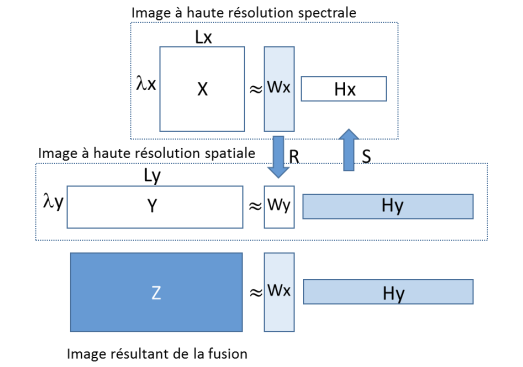

> Bloc en retrait



 **Thèse dont la méthode est extraite :**
 https://tel.archives-ouvertes.fr/tel-01204977/document

# Librairies

**hypers** Provides a data structure model for hyperspectral data.

• Simple tools for exploratory analysis of hyperspectral data

• Interactive hyperspectral viewer built into the object

• Allows for unsupervised machine learning directly on the object (using scikit-learn)

In [1]:
pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 1.9 MB/s 


In [2]:
pip install hypers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.4 MB 4.3 MB/s 
     |████████████████████████████████| 995 kB 23.4 MB/s 
     |████████████████████████████████| 59.9 MB 85 kB/s 
     |████████████████████████████████| 344 kB 41.0 MB/s 


In [3]:
# Import required packages and libraries :

import numpy as np
import hypers as hp
from hypers.learning.decomposition import vca # vertex component analysis
from PIL.Image import *
from PIL import Image
import matplotlib.pyplot as plt
import random
import cv2
from itertools import combinations
import rasterio
from rasterio import plot
%matplotlib inline

# **Algorithme de fusion CNMF**


## Etape 1 

In [5]:
# W et H  sont optimisés avec (3.10) et (3.11) : 
# note : for np.dot, the height of the first matrix has to be equal to the width of the second

def optimiser(X,W,H, epsilon = 1e-5, verbose = True ,max_iterations_without_improv = 200):
  cout_prev = np.linalg.norm(X - np.dot(W,H)) # previous cost
  cout_rec = cout_prev - 2* epsilon   # recent cost
  i = 0
  # best_values = {}
  min_cout = 10
  miwi = 0
  while cout_rec!= 0 and abs((cout_prev - cout_rec)/cout_rec) > epsilon/1000 :  # critère d'arrêt (3.21)
    W = W * np.dot(X,H.T)/np.dot(W,np.dot(H,H.T)) # (3.10)
    H = H * np.dot(W.T,X)/np.dot(W.T,np.dot(W,H)) # (3.11)
    cout_prev = cout_rec
    cout_rec = np.linalg.norm(X - np.dot(W,H))
    if cout_rec < min_cout :
      miwi = 0
      min_cout = cout_rec
    else :
      miwi += 1
    if miwi == max_iterations_without_improv : 
      print('You reach max iterations without improvements (optimiser)')
      break

    if verbose and i%1000 == 0 :
      print("itération (optimiser) ", i , ":" , cout_rec)
    i += 1

  if verbose : print("itération finale (optimiser) :" , cout_rec)
  return W,H,min_cout

In [6]:
def Etape1(Lambda_x,Lx,X) :
 
  # Wx est initialisé en utilisant l’algorithme VCA (Vertex Component Analysis)
  Wx_i = np.random.rand(Lambda_x, Lambda_x)
  Wx_h = hp.array(Wx_i)
  vca_Wx = vca(Wx_h)
  res = vca_Wx.calculate(n_components)
  Wx = res[0]

  # Hx est estimé par (3.11)
  Hx = np.random.rand(n_components,Lx)
  Hx = Hx * np.dot(Wx.T,X)/np.dot(Wx.T,np.dot(Wx,Hx)) # (3.11)

  # Wx et Hx sont optimisés avec (3.10) et (3.11).
  Wx, Hx , cout_x = optimiser(X,Wx,Hx , epsilon = eps , verbose = True)

  return Wx, Hx , cout_x

## Etape 2

In [7]:
def Etape2(R,Wx,Hy,Y ,verbose = True):
 
  # Wy est déduite de Wx
  Wy = np.dot(R,Wx)

  # Hy est estimée par (3.11)
  Hy = Hy * np.dot(Wy.T,Y)/np.dot(Wy.T,np.dot(Wy,Hy))

  # Wy et Hy sont alors optimisés par (3.10) et (3.11)
  Wy, Hy , cout_y  = optimiser(Y,Wy,Hy , epsilon = eps ,verbose = verbose)

  return Wy, Hy , cout_y

## Etape 3

In [8]:
def Etape3(Hy,S,Wx,X , verbose = True) :
  # Hx est déduite de Hy par (3.18) :
  Hx = np.dot(Hy,S) 

  # Wx est ré-estimée par (3.10)
  Wx = Wx * np.dot(X,Hx.T)/np.dot(Wx,np.dot(Hx,Hx.T)) #(3.10)

  # Wx et Hx sont optimisés avec (3.10) et (3.11).
  Wx, Hx , cout_x  = optimiser(X,Wx,Hx , epsilon = eps ,verbose = verbose)
  
  return Wx, Hx , cout_x

## Etape 4

In [9]:
def Etape4(cout_x , cout_y ,R,Wx,Hy,Y,S,X, epsilon = 1e-10,verbose = True ,max_iterations_without_improv = 25):
  cout_moyen_prev = (cout_x + cout_y)/2 # previous mean cost
  cout_moyen_rec = cout_moyen_prev - 2*epsilon # recent mean cost
  i = 0
  best_values = {}
  best_values['cout_moyen'] = 10
  miwi = 0 
  while cout_moyen_rec!= 0 and abs((cout_moyen_prev - cout_moyen_rec)/cout_moyen_rec) > 2*epsilon :   # condition d'arrêt 
    Wy, Hy , cout_y = Etape2(R,Wx,Hy,Y,verbose = False)
    Wx, Hx , cout_x  = Etape3(Hy,S,Wx,X,verbose = False)

    cout_moyen_prev = cout_moyen_rec
    cout_moyen_rec = (cout_x + cout_y)/2
    

    if cout_moyen_rec < best_values['cout_moyen'] :
      best_values['cout_moyen'] = cout_moyen_rec
      best_values['Wx'],best_values['Hx']  = Wx ,Hx
      best_values['Wy'],best_values['Hy']  = Wy ,Hy
      miwi = 0

    else : 
      miwi += 1

    if miwi == max_iterations_without_improv : 
      print('You reach max iterations without improvements (step 4)')
      break

    if verbose and i% 50000 == 0 :
      print("itération (step 4)", i , ":" , cout_moyen_rec)
    i += 10
    #print('miwi ', miwi)
  if verbose : print("itération finale : (step 4)" , cout_moyen_rec)
  return best_values

## Etape 5

In [ ]:
Wx = best_values['Wx']
Hy = best_values['Hy']
Z = np.dot(Wx,Hy)
# Z , Z.shape
print(Z)
plt.imshow(Z)

## Test section

### Creation and split of X

In [10]:
# Useful function to normalize our matrix for the calculs :

def normalize(mat):
  siz = mat.shape
  mat_norm = np.empty(siz)
  max = 0
  min = 255
  for i in range(siz[0]):
    for j in range(siz[1]):
      if mat[i,j] > max :
        max = mat[i,j]
      if mat[i,j] < min :
        min = mat[i,j]
  eps = max - min
  for i in range(siz[0]):
    for j in range(siz[1]):
      mat_norm[i,j] = (mat[i,j] - min)/eps
  return mat_norm

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


shape of mat_hs :
 (71, 100, 3)


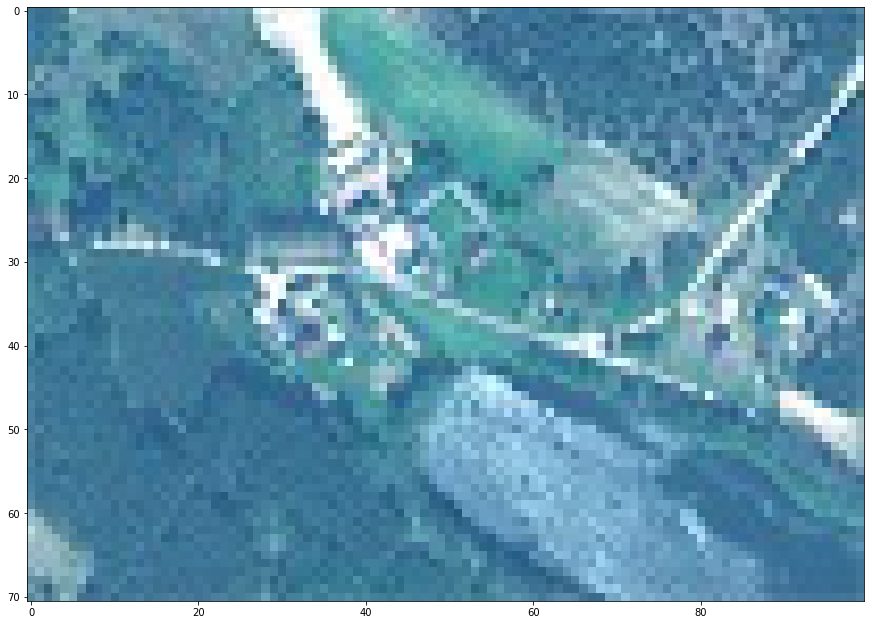

In [12]:
# Import of our virtual hyperspectral image :

dir_hs = '/content/drive/MyDrive/Stage_2022_ACRI-ST/fusion/data/data_for_test/Test_MS.jpg'
im_hs = Image.open(dir_hs)
mat_hyp = np.array(im_hs)

# Visualization of our image :

fig = plt.figure(figsize=(15,15))
fig.add_subplot(1, 1, 1)
plt.imshow(mat_hyp)

print('shape of mat_hs :\n' ,mat_hyp.shape)

Size : (71, 100)
Size : (71, 100)
Size : (71, 100)


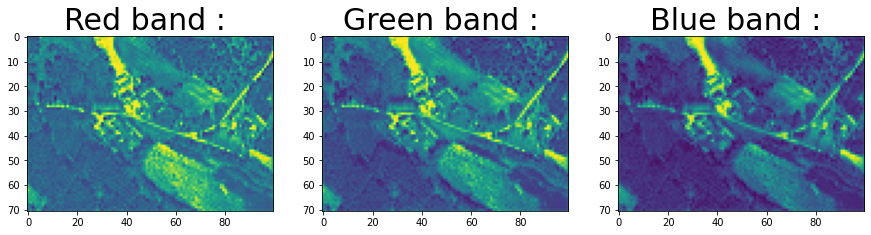

In [13]:
# Now we create our green, red and blue bands of this image : 

b_band_hs = cv2.split(mat_hyp)[0]
g_band_hs = cv2.split(mat_hyp)[1]
r_band_hs = cv2.split(mat_hyp)[2]

fig = plt.figure(figsize=(15,15))
fig.add_subplot(1, 3, 3)
plt.imshow(b_band_hs)
plt.title("Blue band : ", size = 30)
print("Size :", (mat_hyp.shape[0],mat_hyp.shape[1]))

fig.add_subplot(1, 3, 2)
plt.imshow(g_band_hs)
plt.title("Green band : ", size = 30)
print("Size :", (mat_hyp.shape[0],mat_hyp.shape[1])) 

fig.add_subplot(1, 3, 1)
plt.imshow(r_band_hs)
plt.title("Red band : ", size = 30)
print("Size :", (mat_hyp.shape[0],mat_hyp.shape[1]))

In [14]:
# Now we unfold our matrixes in order to apply the CNMF algorithm :

r_band_hs_flat = r_band_hs.flatten()
g_band_hs_flat = g_band_hs.flatten()
b_band_hs_flat = b_band_hs.flatten()
image_hs = []
image_hs.append(r_band_hs_flat)
image_hs.append(g_band_hs_flat)
image_hs.append(b_band_hs_flat)

image_hs = np.array(image_hs)
image_hs = normalize(image_hs)

for i in range(3):
  for j in range(len(image_hs[0])):
    if(image_hs[i][j]) == 1. : image_hs[i][j] = 0.99999
    if(image_hs[i][j]) == 0. : image_hs[i][j] = 0.00005
    
image_hs
# We have our unfolded matrix for the hyperpsectral data !

array([[0.52444446, 0.50666666, 0.50666666, ..., 0.54666668, 0.53777778,
        0.5688889 ],
       [0.40444446, 0.36444443, 0.36000001, ..., 0.39555556, 0.38222224,
        0.42222223],
       [0.15555556, 0.12888889, 0.13777778, ..., 0.16      , 0.16      ,
        0.2       ]])

### Creation and split of Y

shape of mat_ms :
 (142, 200, 3)


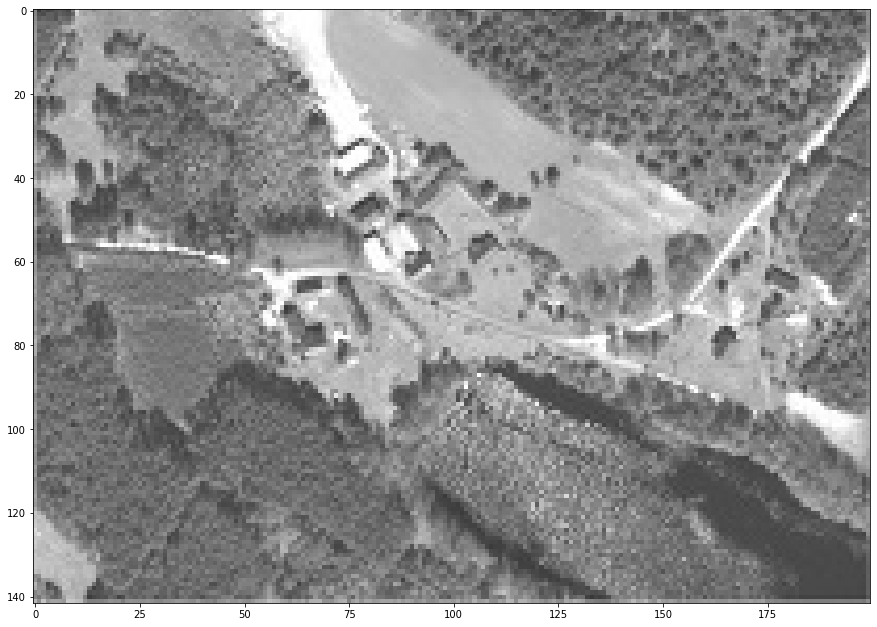

In [15]:
# import of our virtual multispectral image :

dir_ms = '/content/drive/MyDrive/Stage_2022_ACRI-ST/fusion/data/data_for_test/Test_Pan.jpg'
im_ms = Image.open(dir_ms)
mat_ms = np.array(im_ms)

(largeur, hauteur)= im_ms.size

# visualization of our image :

fig = plt.figure(figsize=(15,15))
fig.add_subplot(1, 1, 1)
plt.imshow(mat_ms)

print('shape of mat_ms :\n' ,mat_ms.shape)

Size : (142, 200)
Size : (142, 200)
Size : (142, 200)


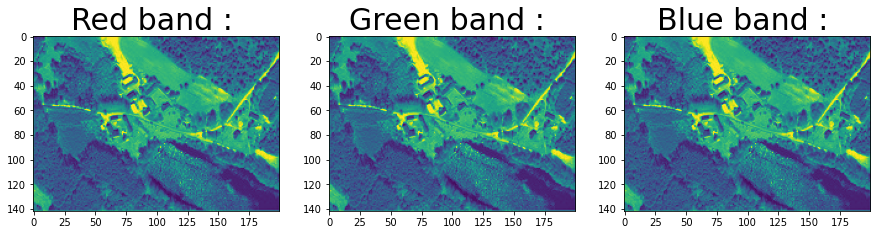

In [16]:
# We visualize the 3 bands : 

b_band_ms = cv2.split(mat_ms)[0]
g_band_ms = cv2.split(mat_ms)[1]
r_band_ms = cv2.split(mat_ms)[2]

fig = plt.figure(figsize=(15,15))
fig.add_subplot(1, 3, 3)
plt.imshow(b_band_ms)
plt.title("Blue band : ", size = 30)
print("Size :", (mat_ms.shape[0],mat_ms.shape[1])) 

fig.add_subplot(1, 3, 2)
plt.imshow(g_band_ms)
plt.title("Green band : ", size = 30)
print("Size :", (mat_ms.shape[0],mat_ms.shape[1])) 

fig.add_subplot(1, 3, 1)
plt.imshow(r_band_ms)
plt.title("Red band : ", size = 30)
print("Size :", (mat_ms.shape[0],mat_ms.shape[1]))



In [17]:
# Now we unfold our matrixes in order to apply the CNMF algorithm :

r_band_ms_flat = r_band_ms.flatten()
g_band_ms_flat = g_band_ms.flatten()
b_band_ms_flat = b_band_ms.flatten()
image_ms = []
image_ms.append(r_band_ms_flat)
image_ms.append(g_band_ms_flat)
image_ms.append(b_band_ms_flat)

image_ms = np.array(image_ms)
image_ms = normalize(image_ms)

# for i in range(3):
for j in range(len(image_ms[0])):
    if(image_ms[0][j]) == 1. : image_ms[0][j] = 0.9999
    if(image_ms[0][j]) == 0. : image_ms[0][j] = 0.0005

image_ms

# We have our unfolded matrix for the multispectral data !

array([[0.38      , 0.02      , 0.13500001, ..., 0.35499999, 0.33000001,
        0.42500001],
       [0.38      , 0.02      , 0.13500001, ..., 0.35499999, 0.33000001,
        0.42500001],
       [0.38      , 0.02      , 0.13500001, ..., 0.35499999, 0.33000001,
        0.42500001]])

### Implementation of the Algorithme

#### Parameters

In [18]:
######## Critère de précision : #########
eps = 1e-2

# Parameters of Etape 1 :

# hyp = unfold(r_sub_matrix_hs,g_sub_matrix_hs)
Lambda_x = image_hs.shape[0]
Lx = image_hs.shape[1]
n_components = 3

# Parameters of Etape 2 :

Lambda_y = image_ms.shape[0]
Ly = image_ms.shape[1]
R = np.random.rand(Lambda_y, Lambda_x)
S = np.random.rand(Ly, Lx)
Hy = np.random.rand(n_components, Ly)

print( "Parameters :\n\nLambda_x :", Lambda_x, "\nLx :",Lx, "\nn_components :", n_components, "\nLambda_y :", Lambda_y, "\nLy :",Ly, "\nR :\n", R, "\nS :\n", S, "\nHy :\n", Hy,"\n\nCritère de précision :\n", eps)

Parameters :

Lambda_x : 3 
Lx : 7100 
n_components : 3 
Lambda_y : 3 
Ly : 28400 
R :
 [[0.53616372 0.46547728 0.80751988]
 [0.02308234 0.19186417 0.578622  ]
 [0.15403925 0.56639184 0.26898527]] 
S :
 [[0.48777211 0.92983094 0.74756172 ... 0.56028327 0.38904187 0.95266646]
 [0.11355253 0.40239566 0.15495735 ... 0.54158893 0.88065527 0.26551269]
 [0.24689804 0.09961097 0.43091454 ... 0.31591968 0.83892724 0.51237286]
 ...
 [0.94562515 0.45496325 0.66889253 ... 0.88448257 0.93295556 0.66264579]
 [0.81597055 0.77162623 0.62262411 ... 0.1411184  0.53258315 0.46565484]
 [0.51383399 0.52362431 0.89530636 ... 0.54324487 0.13818903 0.60601551]] 
Hy :
 [[0.7224825  0.07244959 0.1878802  ... 0.24086636 0.78595498 0.86039575]
 [0.10641334 0.53822134 0.41564076 ... 0.22422467 0.01339336 0.9505434 ]
 [0.55272364 0.97075353 0.77484293 ... 0.5097501  0.05591336 0.43881531]] 

Critère de précision :
 0.01


#### Algorithme

In [19]:
def Algo_CNMF(Lambda_x,Lx,X,R,S,Hy,Y,steps = True):
  verbose = steps
  Wx, Hx , cout_x = Etape1(Lambda_x,Lx,X)
  Wy, Hy , cout_y = Etape2(R,Wx,Hy,Y,verbose)
  Wx, Hx , cout_x  = Etape3(Hy,S,Wx,X ,verbose)

  best_values = Etape4(cout_x , cout_y ,R,Wx,Hy,Y,S,X, epsilon = eps,verbose =steps, max_iterations_without_improv = 15)
  Wx = best_values['Wx']
  Hy = best_values['Hy']
  Z = np.dot(Wx,Hy)
  return Z,Wx,Hy,cout_x,cout_y

In [20]:
def Algo_CNMF_v2(Lambda_x,Lx,X,R,S,Hy,Y,Wx,cout_x,cout_y,steps = True) :
  verbose = steps
  best_values = Etape4(cout_x , cout_y ,R,Wx,Hy,Y,S,X, epsilon = eps,verbose =steps, max_iterations_without_improv = 15)
  Wx = best_values['Wx']
  Hy = best_values['Hy']
  Z = np.dot(Wx,Hy)
  return Z,Wx,Hy,cout_x,cout_y

In [ ]:
# Test :
Z_final = Algo_CNMF(Lambda_x,Lx,image_hs,R,S,Hy,image_ms, steps = True)

/usr/local/lib/python3.7/dist-packages/hypers/learning/decomposition.py:44: RuntimeWarning: invalid value encountered in log10
  snr_est = 10 * np.log10((P_x - p / L * P_y) / (P_y - P_x))


SNR estimated = nan[dB]
... Select the projective proj.
itération (optimiser)  0 : 12.057751047001998
itération (optimiser)  1000 : 0.35274741219005645
itération (optimiser)  2000 : 0.23372685591678818
itération (optimiser)  3000 : 0.19577166034506246
itération (optimiser)  4000 : 0.17121900795011782
itération (optimiser)  5000 : 0.15563747859145585
itération (optimiser)  6000 : 0.14346488477164565
itération (optimiser)  7000 : 0.1291380927777684
itération (optimiser)  8000 : 0.11772938731952248
itération (optimiser)  9000 : 0.11100769794669561
itération (optimiser)  10000 : 0.1036173417480822
itération (optimiser)  11000 : 0.09952035229343834
itération (optimiser)  12000 : 0.09247187711402133
itération (optimiser)  13000 : 0.08844719267797921
itération (optimiser)  14000 : 0.08428135771148958
itération (optimiser)  15000 : 0.08062326916300734
itération (optimiser)  16000 : 0.07884052728253792
itération (optimiser)  17000 : 0.07457448083330527
itération (optimiser)  18000 : 0.072164889

In [ ]:
# Test 2:
Z_final_2 = Algo_CNMF_v2(Lambda_x,Lx,image_hs,R,S,Z_final[2],image_ms,Z_final[1],Z_final[3], Z_final[4],steps = True)

itération (step 4) 0 : 0.00022912068747187394
itération finale : (step 4) 0.00022871945443909503


In [21]:
# Reconstitution of our final image : 

# We reshape our colors matrix :

len_0 = Z_final[0].shape[0]
len_1 = mat_ms.shape[0]
len_2 = mat_ms.shape[1]
mat_final_red = Z_final[0][0].reshape(len_1,len_2)
mat_final_green = Z_final[0][1].reshape(len_1,len_2)
mat_final_blue = Z_final[0][2].reshape(len_1,len_2)

fact_red = 255/(np.max(Z_final[0][0]))
fact_green = 255/(np.max(Z_final[0][1]))
fact_blue = 255/(np.max(Z_final[0][2]))

mat_finale = np.empty((len_1,len_2,3))
for i in range(len_1):
  for j in range(len_2):
    mat_finale[i][j][0] = mat_final_red[i][j]*fact_red
    mat_finale[i][j][1] = mat_final_green[i][j]*fact_green
    mat_finale[i][j][2] = mat_final_blue[i][j]*fact_blue
mat_finale = mat_finale.astype('uint8') 
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,1,1)
plt.imshow(mat_finale)
print(" /!\ Before denoising :")

NameError: ignored

 /!\ Before denoising :


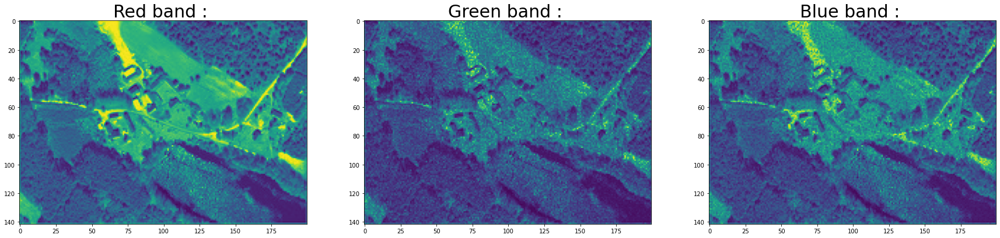

In [ ]:
# The 3 bands obtained are : 

mat_res_blue = cv2.split(mat_finale)[0]
mat_res_green = cv2.split(mat_finale)[1]
mat_res_red = cv2.split(mat_finale)[2]

fig = plt.figure(figsize=(30,30))
fig.add_subplot(1, 3, 3)
plt.imshow(mat_res_blue)
plt.title("Blue band : ", size = 30)

fig.add_subplot(1, 3, 2)
plt.imshow(mat_res_green)
plt.title("Green band : ", size = 30)

fig.add_subplot(1, 3, 1)
plt.imshow(mat_res_red)
plt.title("Red band : ", size = 30)
print(" /!\ Before denoising :")

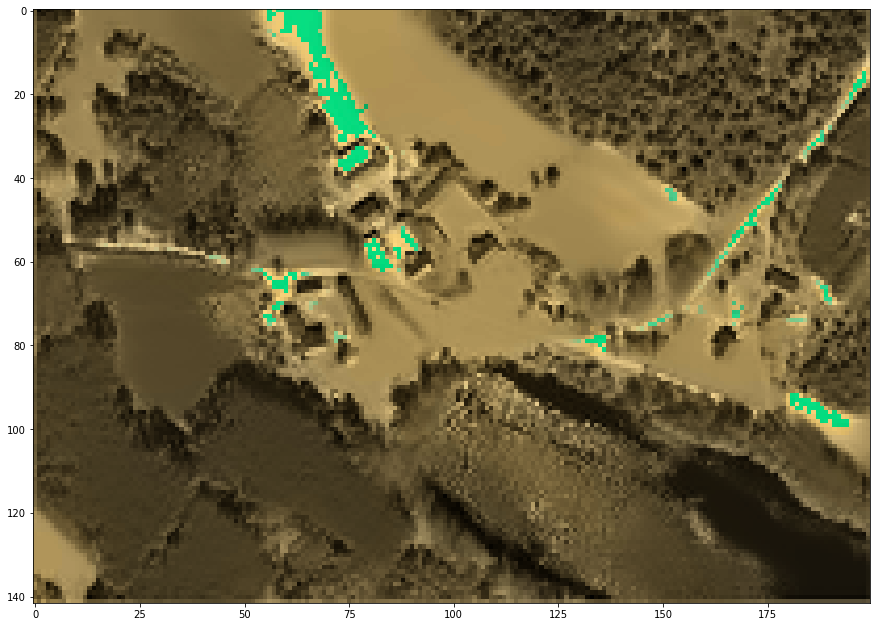

In [ ]:
denoised_image_color = cv2.fastNlMeansDenoisingColored(mat_finale,None,10,10,7,21)
fig = plt.figure(figsize=(15,15))
plt.imshow(denoised_image_color)

######**Another approach :**

In [ ]:
# another approach :

# We will apply the cnmf on each color :

b_band = image_hs[2]
b_band_final = []
b_band_final.append(b_band)
b_band_final.append(b_band)
b_band_final.append(b_band)
b_band_final = np.array(b_band_final)

g_band = image_hs[1]
g_band_final = []
g_band_final.append(g_band)
g_band_final.append(g_band)
g_band_final.append(g_band)
g_band_final = np.array(g_band_final)

r_band = image_hs[0]
r_band_final = []
r_band_final.append(r_band)
r_band_final.append(r_band)
r_band_final.append(r_band)
r_band_final = np.array(r_band_final)


NameError: ignored

In [ ]:
######## Critère de précision : #########
eps = 1e-5
# Parameters of Etape 1 :

# hyp = unfold(r_sub_matrix_hs,g_sub_matrix_hs)
Lambda_x = r_band_final.shape[0]
Lx = r_band_final.shape[1]
n_components = 3

# Parameters of Etape 2 :

Lambda_y = Ly = image_ms.shape[0]
Ly = image_ms.shape[1]
R = np.random.rand(Lambda_y, Lambda_x)
S = S
Hy = np.random.rand(n_components, Ly)

print( "Parameters :\n\nLambda_x :", Lambda_x, "\nLx :",Lx, "\nn_components :", n_components, "\nLambda_y :", Lambda_y, "\nLy :",Ly, "\nR :\n", R, "\nS :\n", S, "\nHy :\n", Hy,"\n\nCritère de précision :\n", eps)

Parameters :

Lambda_x : 3 
Lx : 7100 
n_components : 3 
Lambda_y : 3 
Ly : 28400 
R :
 [[0.82362829 0.39388394 0.91896861]
 [0.94655141 0.51115438 0.12087669]
 [0.92996053 0.03891454 0.049854  ]] 
S :
 [[0.12126483 0.44537934 0.11940999 ... 0.12384068 0.96565881 0.89842211]
 [0.47157043 0.86908432 0.88228557 ... 0.86270378 0.6436001  0.14296824]
 [0.14530937 0.23205497 0.44632118 ... 0.20704971 0.23478591 0.09089377]
 ...
 [0.96723352 0.76311611 0.98425424 ... 0.06356638 0.99527727 0.86138076]
 [0.96681975 0.9252109  0.02900867 ... 0.53501167 0.56721639 0.7076238 ]
 [0.37091378 0.12505364 0.14041305 ... 0.23652206 0.01294143 0.47024334]] 
Hy :
 [[0.55447643 0.81056629 0.25529482 ... 0.26316154 0.96063801 0.52268416]
 [0.68672359 0.5445019  0.7596137  ... 0.74389761 0.68374568 0.77400605]
 [0.9048213  0.33002679 0.28468033 ... 0.60761328 0.94174076 0.40154508]] 

Critère de précision :
 1e-05


In [ ]:
# Test :
Z_r_band = Algo_CNMF(Lambda_x,Lx,r_band_final,R,S,Hy,image_ms, steps = True)

SNR estimated = nan[dB]
... Select the projective proj.
itération (optimiser)  0 : 9.267337803435948
itération finale (optimiser) : 2.311557924367881e-15
itération (optimiser)  0 : 0.0012807194991402801
itération finale (optimiser) : 0.0012805731053141265
itération (optimiser)  0 : 9.10518263178014e-15
itération finale (optimiser) : 2.447531919918933e-15
You reach max iterations without improvements (optimiser)
itération (step 4) 0 : 0.0006402865528275954
itération finale : (step 4) 0.000640286552996682


In [ ]:
# Test :
Z_g_band = Algo_CNMF(Lambda_x,Lx,g_band_final,R,S,Hy,image_ms, steps = True)

SNR estimated = nan[dB]
... Select the projective proj.
itération (optimiser)  0 : 5.5552992189687895
itération finale (optimiser) : 3.0435099244991546e-15
itération (optimiser)  0 : 0.0012807217467422597
itération finale (optimiser) : 0.00128057909618038
itération (optimiser)  0 : 8.245368239736002e-15
You reach max iterations without improvements (optimiser)
itération finale (optimiser) : 2.0888721554953336e-15
You reach max iterations without improvements (optimiser)
itération (step 4) 0 : 0.0006402895487488216
You reach max iterations without improvements (optimiser)
itération finale : (step 4) 0.0006402895494064225


In [ ]:
# Test :
Z_b_band = Algo_CNMF(Lambda_x,Lx,b_band_final,R,S,Hy,image_ms, steps = True)

SNR estimated = nan[dB]
... Select the projective proj.
itération (optimiser)  0 : 5.679491193173017
itération (optimiser)  1000 : 1.8375880828489833e-15
You reach max iterations without improvements (optimiser)
itération finale (optimiser) : 1.838216820226022e-15
itération (optimiser)  0 : 0.0012807436814313898
itération finale (optimiser) : 0.0012806369530307502
itération (optimiser)  0 : 5.137705072196077e-15
You reach max iterations without improvements (optimiser)
itération finale (optimiser) : 3.891364861379566e-15
You reach max iterations without improvements (optimiser)
itération (step 4) 0 : 0.0006403184784864929
You reach max iterations without improvements (optimiser)
itération finale : (step 4) 0.0006403184804565029


 /!\ Before denoising :


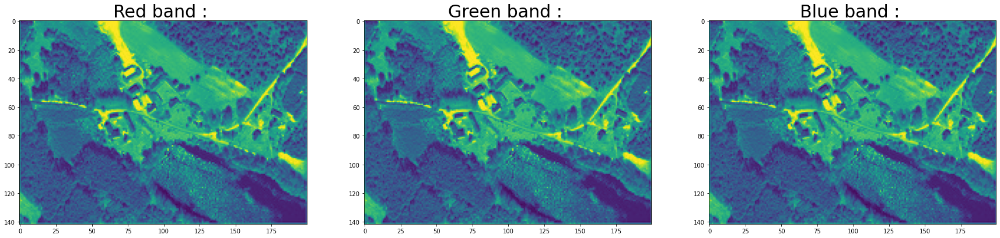

In [ ]:
len_1 = mat_ms.shape[0]
len_2 = mat_ms.shape[1]

# The 3 bands obtained are : 
fig = plt.figure(figsize=(30,30))
fig.add_subplot(1, 3, 3)
mat_res_blue_final = Z_b_band[0][0].reshape(len_1,len_2)
plt.imshow(mat_res_blue_final)
plt.title("Blue band : ", size = 30)

fig.add_subplot(1, 3, 2)
mat_res_green_final = Z_g_band[0][0].reshape(len_1,len_2)
plt.imshow(mat_res_green_final)
plt.title("Green band : ", size = 30)

fig.add_subplot(1, 3, 1)
mat_res_red_final = Z_r_band[0][0].reshape(len_1,len_2)
plt.imshow(mat_res_red_final)
plt.title("Red band : ", size = 30)
print(" /!\ Before denoising :")

In [ ]:
liste = [1,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2,2.1,2.2,2.3,2.4,2.5,2.6,2.7,2.8,2.9,3]
temp = combinations(liste, 3)
liste_combo = list(temp)
len(liste_combo)

1330

In [ ]:
n = len(liste_combo)
res = []
fig = plt.figure(figsize=(400,400))
for k in range(n):
  mat_final = np.empty((len_1,len_2,3))
  for i in range(len_1):
    for j in range(len_2):
      mat_final[i][j][0] = mat_res_red_final[i][j]*255*1e4*liste_combo[k][0]
      mat_final[i][j][1] = mat_res_green_final[i][j]*255*1e4*liste_combo[k][1]
      mat_final[i][j][2] = mat_res_blue_final[i][j]*255*1e4*liste_combo[k][2]
  mat_final = mat_final.astype('uint8')
  res.append(mat_final) 
  # fig.add_subplot(n//3+5,3,k+1)
  # plt.imshow(mat_final)
  # plt.title(liste_combo[k])

KeyboardInterrupt: ignored

<Figure size 28800x28800 with 0 Axes>

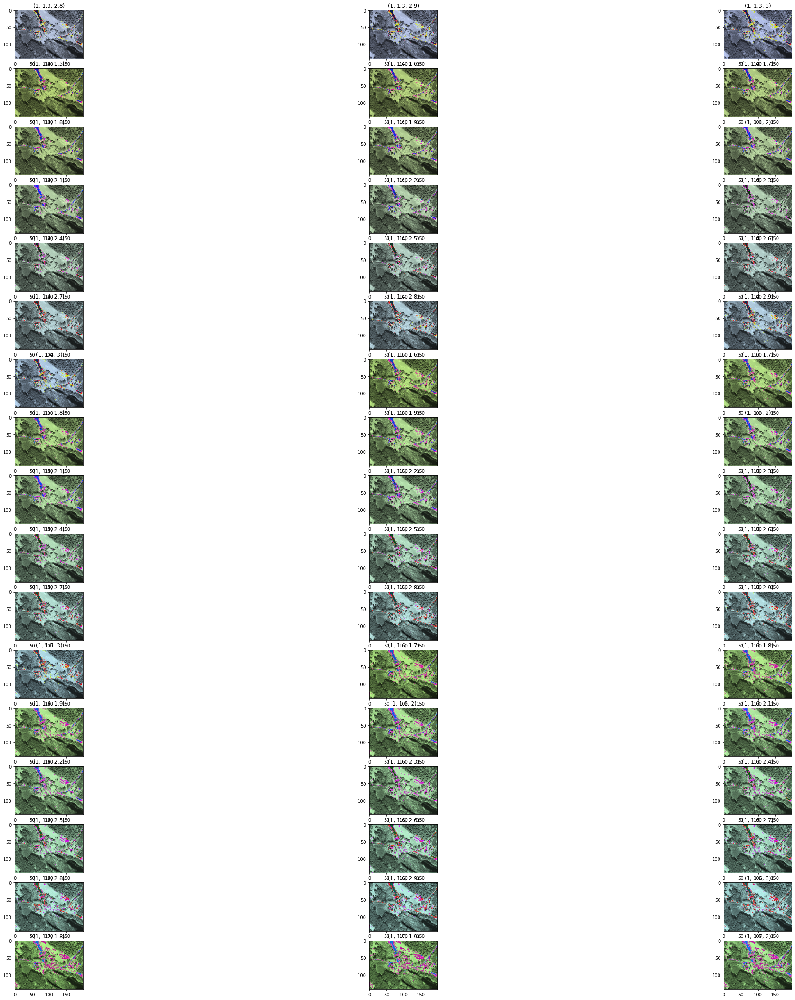

In [ ]:
nb = 51*1
nb2 = nb+51
fig = plt.figure(figsize=(40,40))
for i in range(nb,nb2):
  fig.add_subplot(51//3,3,i-nb+1)
  plt.imshow(res[i])
  plt.title(liste_combo[i])

 /!\ Before denoising :


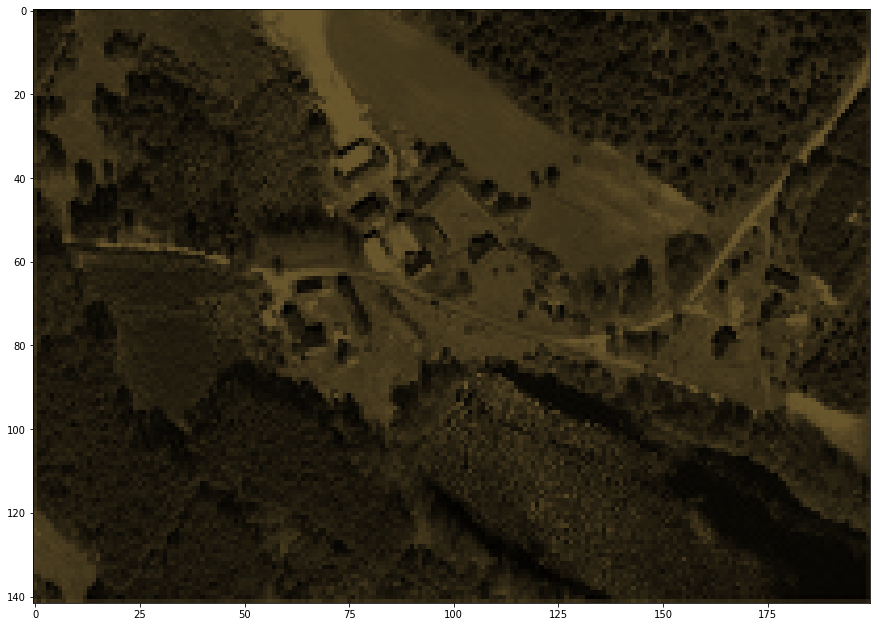

In [ ]:
# Reconstitution of the image :

# Reconstitution of our final image : 

# We reshape our colors matrix :

len_0 = Z_b_band[0].shape[0]

mat_final = np.empty((len_1,len_2,3))
for i in range(len_1):
  for j in range(len_2):
    mat_final[i][j][0] = mat_res_red_final[i][j]*1e6
    mat_final[i][j][1] = mat_res_green_final[i][j]*1e6
    mat_final[i][j][2] = mat_res_blue_final[i][j]*1e6
mat_final = mat_final.astype('uint8') 
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,1,1)
plt.imshow(mat_final)
print(" /!\ Before denoising :")

#**Test on real images :**

In [22]:
#import bands as separate 1 band raster
imagePath10m = '/content/drive/MyDrive/Stage_2022_ACRI-ST/fusion/data/sentinel_2_data/S2B_MSIL2A_20220526T072209_N0400_R063_T38KMG_20220526T094314.SAFE/GRANULE/L2A_T38KMG_A027259_20220526T072203/IMG_DATA/R10m/'
band2 = rasterio.open(imagePath10m+'T38KMG_20220526T072209_B02_10m.jp2', driver='JP2OpenJPEG') #blue
band3 = rasterio.open(imagePath10m+'T38KMG_20220526T072209_B03_10m.jp2', driver='JP2OpenJPEG') #green
band4 = rasterio.open(imagePath10m+'T38KMG_20220526T072209_B04_10m.jp2', driver='JP2OpenJPEG') #red
band8 = rasterio.open(imagePath10m+'T38KMG_20220526T072209_B08_10m.jp2', driver='JP2OpenJPEG') #nir

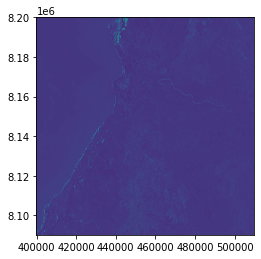

Blue band


In [ ]:
# The 4 bands of our Sentinel-2 images are : 

plot.show(band2)
print("Blue band")

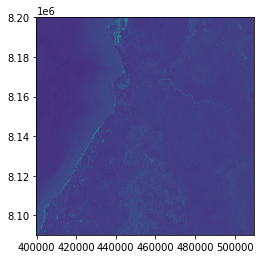

Green band


In [ ]:
plot.show(band3)
print("Green band")

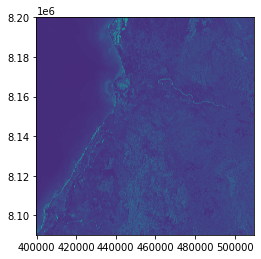

Red band


In [ ]:
plot.show(band4)
print("Red band")

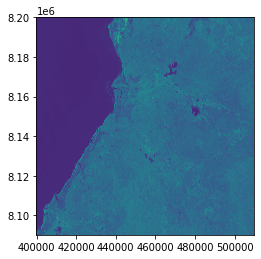

Near IR band


In [ ]:
plot.show(band8)
print("Near IR band")

In [24]:
# We are limitated by the computing power, so we reduce the size of the images for the calculations (for each bands):

larg = band4.read(1).shape[1]
long = larg
new_size = 250

band2_S2 = np.empty((new_size,new_size)).astype('uint16')
band2_as_array = band2.read(1).astype('uint16')
for i in range(long-new_size,long):
  for j in range(new_size):
    band2_S2[i-long+new_size][j]=band2_as_array[i][j]

In [26]:
band3_S2 = np.empty((new_size,new_size)).astype('uint16')
band3_as_array = band3.read(1).astype('uint16')
for i in range(long-new_size,long):
  for j in range(new_size):
    band3_S2[i-long+new_size][j]=band3_as_array[i][j]

In [27]:
band4_S2 = np.empty((new_size,new_size)).astype('uint16')
band4_as_array = band4.read(1).astype('uint16')
for i in range(long-new_size,long):
  for j in range(new_size):
    band4_S2[i-long+new_size][j]=band4_as_array[i][j]

In [28]:
band8_S2 = np.empty((new_size,new_size)).astype('uint16')
band8_as_array = band8.read(1).astype('uint16')
for i in range(long-new_size,long):
  for j in range(new_size):
    band8_S2[i-long+new_size][j]=band8_as_array[i][j]

Text(0.5, 1.0, 'Near_IR band : ')

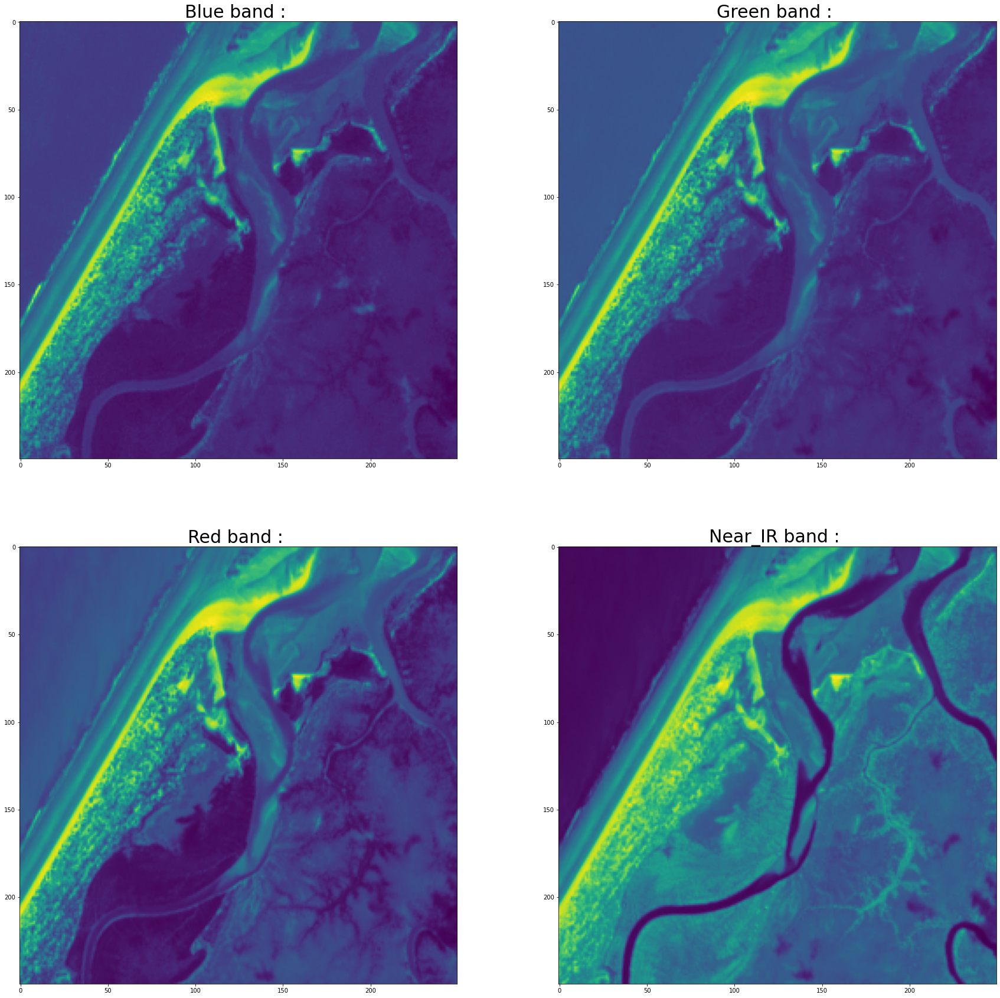

In [29]:
# The 4 images obtained are : 

fig = plt.figure(figsize=(30,30))
fig.add_subplot(2, 2, 1)
plt.imshow(band2_S2)
plt.title("Blue band : ", size = 30)

fig.add_subplot(2, 2, 2)
plt.imshow(band3_S2)
plt.title("Green band : ", size = 30)

fig.add_subplot(2, 2, 3)
plt.imshow(band4_S2)
plt.title("Red band : ", size = 30)

fig.add_subplot(2, 2, 4)
plt.imshow(band8_S2)
plt.title("Near_IR band : ", size = 30)

In [ ]:
# The resolution of these images is 250 x 250 pixels

Text(0.5, 1.0, 'Blue band2 : ')

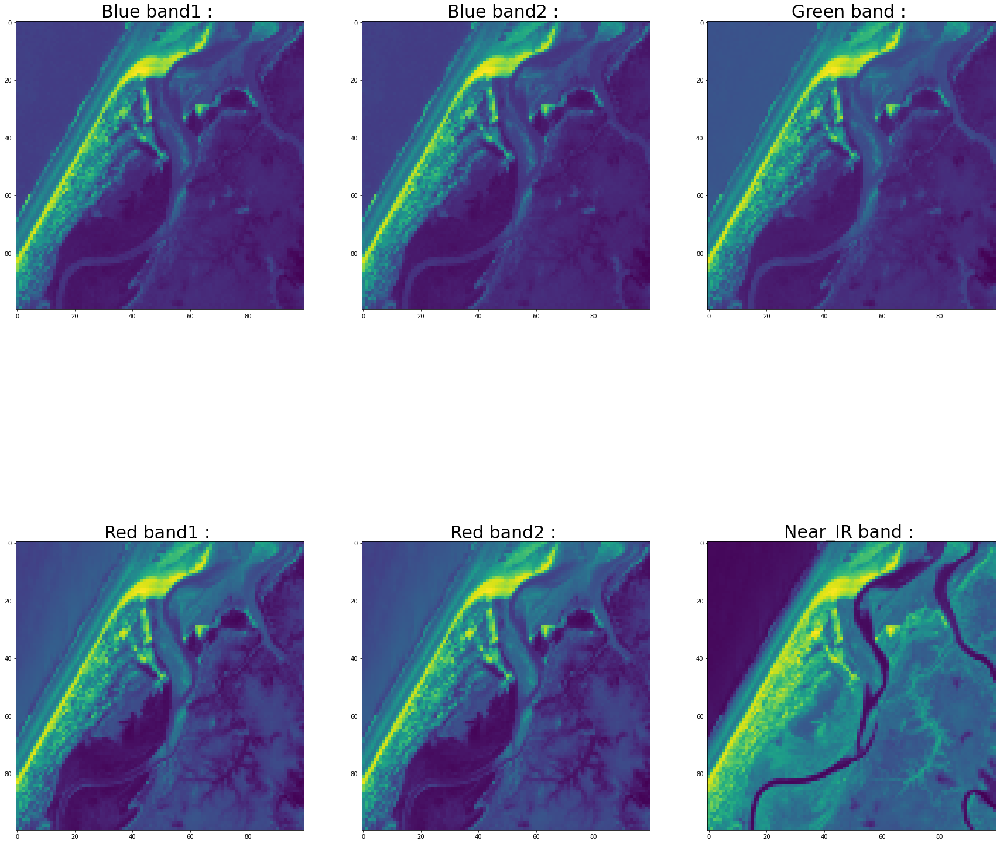

In [32]:
# Now we will artificially deteriorate those Sentinel-2 images to simulate Sentinel-3 images :
new_size = 100

band1_S3 = cv2.resize(band2_S2,dsize=(new_size, new_size))+1500
band2_S3 = cv2.resize(band2_S2,dsize=(new_size, new_size))
band3_S3 = cv2.resize(band3_S2,dsize=(new_size, new_size))
band4_S3 = cv2.resize(band4_S2,dsize=(new_size, new_size))
band5_S3 = cv2.resize(band4_S2,dsize=(new_size, new_size))+1500
band8_S3 = cv2.resize(band8_S2,dsize=(new_size, new_size))


fig = plt.figure(figsize=(30,30))
fig.add_subplot(2, 3, 1)
plt.imshow(band2_S3)
plt.title("Blue band1 : ", size = 30)

fig.add_subplot(2, 3, 3)
plt.imshow(band3_S3)
plt.title("Green band : ", size = 30)

fig.add_subplot(2, 3, 4)
plt.imshow(band4_S3)
plt.title("Red band1 : ", size = 30)

fig.add_subplot(2, 3, 6)
plt.imshow(band8_S3)
plt.title("Near_IR band : ", size = 30)

fig.add_subplot(2, 3, 5)
plt.imshow(band5_S3)
plt.title("Red band2 : ", size = 30)

fig.add_subplot(2, 3, 2)
plt.imshow(band1_S3)
plt.title("Blue band2 : ", size = 30)

In [39]:
# Now we flatten our matrix :
dim_S2 = band2_S2.shape[0]
dim_S3 = band2_S3.shape[0]

S2_flat = []
S3_flat = []

band2_S2_flat = band2_S2.flatten()
band3_S2_flat = band3_S2.flatten()
band4_S2_flat = band4_S2.flatten()
band8_S2_flat = band8_S2.flatten()

band1_S3_flat = band1_S3.flatten()
band2_S3_flat = band2_S3.flatten()
band3_S3_flat = band3_S3.flatten()
band4_S3_flat = band4_S3.flatten()
band5_S3_flat = band5_S3.flatten()
band8_S3_flat = band8_S3.flatten()

S2_flat.append(band2_S2_flat)
S2_flat.append(band3_S2_flat)
S2_flat.append(band4_S2_flat)
S2_flat.append(band8_S2_flat)

S3_flat.append(band1_S3_flat)
S3_flat.append(band2_S3_flat)
S3_flat.append(band3_S3_flat)
S3_flat.append(band4_S3_flat)
S3_flat.append(band5_S3_flat)
S3_flat.append(band8_S3_flat)

S2_flat = np.array(S2_flat)
S2_flat = normalize(S2_flat)

S3_flat = np.array(S3_flat)
S3_flat = normalize(S3_flat)

In [36]:
np.unique(S2_flat)

array([0.16956433, 0.16976887, 0.17038249, ..., 0.99590918, 0.99918184,
       0.9999    ])

In [35]:
for i in range(len(S2_flat)):
  for j in range(len(S2_flat[0])):
    if(S2_flat[i][j]) == 1. : S2_flat[i][j] = 0.9999
    if(S2_flat[i][j]) == 0. : S2_flat[i][j] = 0.0001

for i in range(len(S3_flat)):
  for j in range(len(S3_flat[0])):
    if(S3_flat[i][j]) == 1. : S3_flat[i][j] = 0.9999
    if(S3_flat[i][j]) == 0. : S3_flat[i][j] = 0.0001


np.unique(S2_flat)

array([0.16956433, 0.16976887, 0.17038249, ..., 0.99590918, 0.99918184,
       0.9999    ])

In [40]:
######## Critère de précision : #########
eps = 1e-1

# Parameters of Etape 1 :

# hyp = unfold(r_sub_matrix_hs,g_sub_matrix_hs)
Lambda_x = 6
Lx = dim_S3**2
n_components = 6

# Parameters of Etape 2 :

Lambda_y = 4
Ly = dim_S2**2
R = np.random.rand(Lambda_y, Lambda_x)
S = np.random.rand(Ly, Lx)
Hy = np.random.rand(n_components, Ly)

print( "Parameters :\n\nLambda_x :", Lambda_x, "\nLx :",Lx, "\nn_components :", n_components, "\nLambda_y :", Lambda_y, "\nLy :",Ly, "\nR :\n", R, "\nS :\n", S, "\nHy :\n", Hy,"\n\nCritère de précision :\n", eps)

Parameters :

Lambda_x : 6 
Lx : 10000 
n_components : 6 
Lambda_y : 4 
Ly : 62500 
R :
 [[0.76192056 0.97812303 0.72067529 0.89200992 0.39987306 0.95514159]
 [0.75584416 0.15116219 0.41677959 0.66211672 0.1997861  0.33716648]
 [0.23929112 0.75623082 0.57394678 0.99164905 0.32662198 0.47986802]
 [0.42325962 0.47433091 0.19295188 0.23820956 0.38159054 0.21627415]] 
S :
 [[0.51278048 0.87372331 0.14022485 ... 0.76690444 0.93133833 0.13379088]
 [0.09404074 0.16211371 0.61698613 ... 0.1096823  0.74420528 0.10181416]
 [0.31520642 0.57638446 0.75690495 ... 0.87744208 0.16906561 0.9697841 ]
 ...
 [0.82484455 0.48323281 0.30756142 ... 0.51623407 0.41484479 0.68371356]
 [0.86922566 0.22744226 0.44136499 ... 0.55620299 0.71970126 0.90040638]
 [0.74881889 0.41700011 0.82828726 ... 0.20480773 0.21175085 0.66136437]] 
Hy :
 [[0.04052112 0.66703242 0.85252405 ... 0.74238408 0.67997947 0.18437532]
 [0.31534499 0.37757005 0.62155495 ... 0.31451963 0.32396049 0.27364547]
 [0.85131143 0.80670095 0.58311

In [41]:
Test_final = Algo_CNMF(Lambda_x,Lx,S3_flat,R,S,Hy,S2_flat, steps = True)

SNR estimated = nan[dB]
... Select the projective proj.
itération (optimiser)  0 : 16.713252714235537
itération (optimiser)  1000 : 0.6251788301910484
itération (optimiser)  2000 : 0.5341742277811103
itération (optimiser)  3000 : 0.40501555338568823
itération (optimiser)  4000 : 0.2704135920064124
itération (optimiser)  5000 : 0.17694408333702216
itération (optimiser)  6000 : 0.12593384383262823
itération (optimiser)  7000 : 0.09819292065089748
itération (optimiser)  8000 : 0.08078736650025237
itération (optimiser)  9000 : 0.06856504206836199
itération (optimiser)  10000 : 0.05948070274119885
itération (optimiser)  11000 : 0.05294658426871196
itération finale (optimiser) : 0.051956966280300984
itération (optimiser)  0 : 32.31954877466573
itération (optimiser)  1000 : 2.0403963346228546
itération (optimiser)  2000 : 1.5792720487190306
itération (optimiser)  3000 : 0.845923254905032
itération (optimiser)  4000 : 0.5055440253515793
itération (optimiser)  5000 : 0.37294113504098225
itérati

In [ ]:
Test_final = Algo_CNMF_v2(Lambda_x,Lx,S3_flat,R,S,Test_final[2],S2_flat, Test_final[1], Test_final[3], Test_final[4], steps = True)

KeyboardInterrupt: ignored

Text(0.5, 1.0, 'Near_IR band : ')

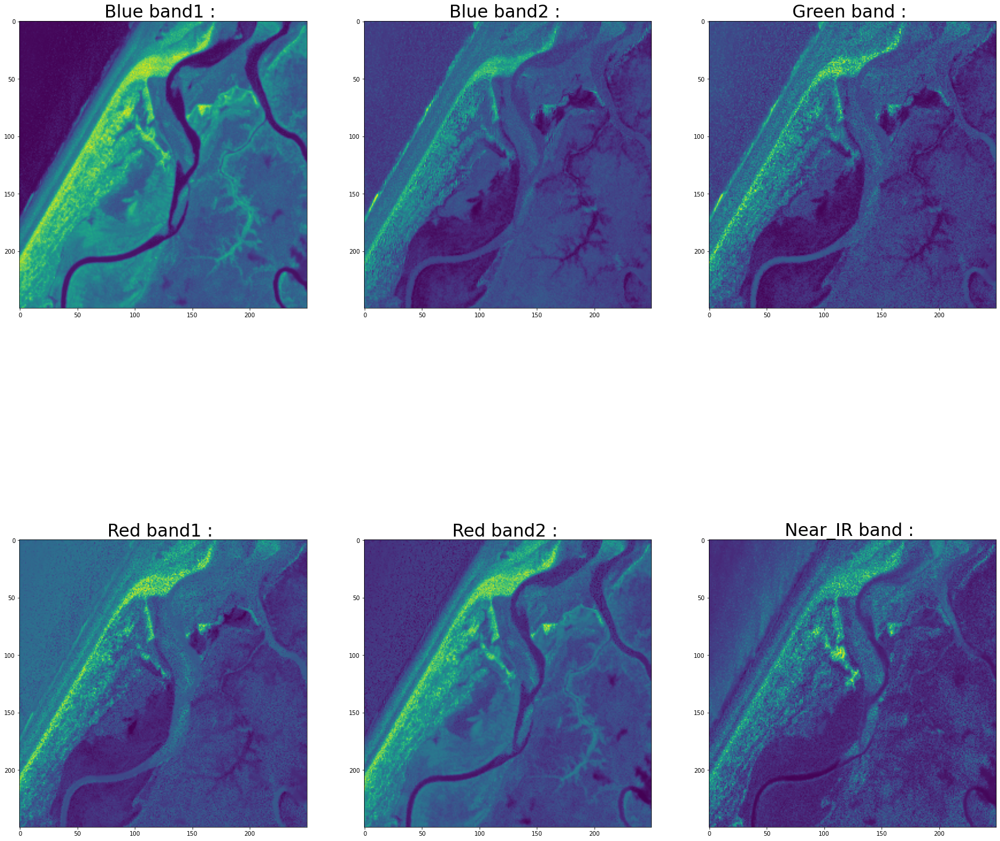

In [42]:
# We plots the results :

res = Test_final[0]

len_0 = res.shape[0]
len_1 = band2_S2.shape[0]
len_2 = band2_S2.shape[1]
mat_final_blue1 = res[0].reshape(len_1,len_2)
mat_final_blue2 = res[1].reshape(len_1,len_2)
mat_final_green = res[2].reshape(len_1,len_2)
mat_final_red1 = res[3].reshape(len_1,len_2)
mat_final_red2 = res[4].reshape(len_1,len_2)
mat_final_IR = res[5].reshape(len_1,len_2)

fig = plt.figure(figsize=(30,30))
fig.add_subplot(2, 3, 1)
plt.imshow(mat_final_blue1)
plt.title("Blue band1 : ", size = 30)

fig.add_subplot(2, 3, 2)
plt.imshow(mat_final_blue2)
plt.title("Blue band2 : ", size = 30)

fig.add_subplot(2, 3, 3)
plt.imshow(mat_final_green)
plt.title("Green band : ", size = 30)

fig.add_subplot(2, 3, 4)
plt.imshow(mat_final_red1)
plt.title("Red band1 : ", size = 30)

fig.add_subplot(2, 3, 5)
plt.imshow(mat_final_red2)
plt.title("Red band2 : ", size = 30)

fig.add_subplot(2, 3, 6)
plt.imshow(mat_final_IR)
plt.title("Near_IR band : ", size = 30)
